# Computer Vision color spaces

### Import statements

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [3]:
def imshow(img):
    plt.figure(figsize = (20,15));
    plt.imshow(img[:,:,::-1])

### To edit an image making a copy of it is always a good idea!

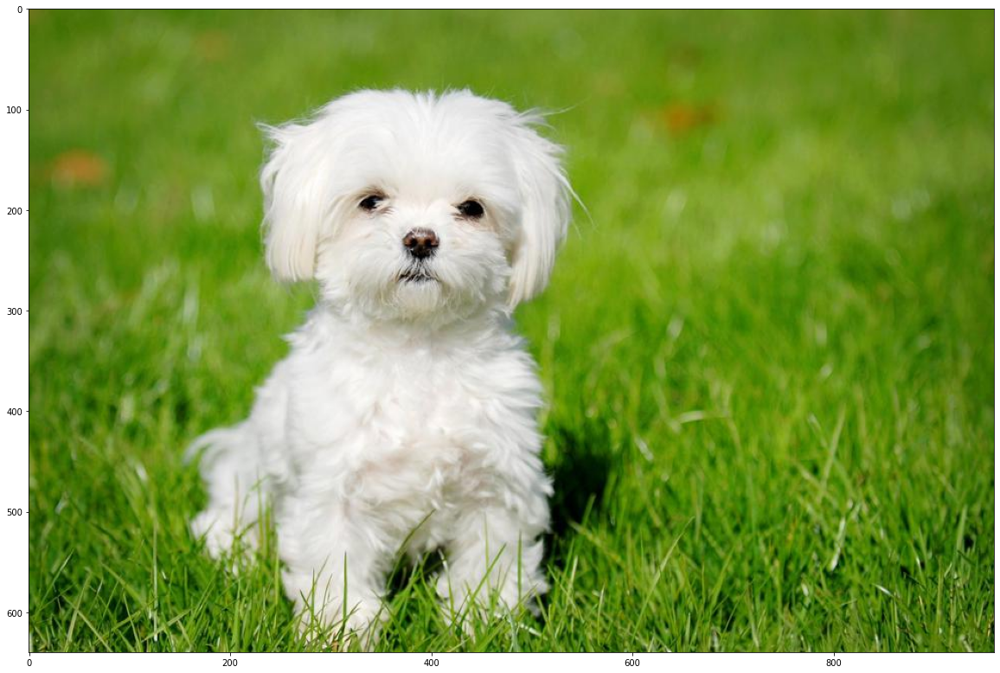

In [5]:
# Load an image
# And make a copy of the original image to avoid manipulating the original image
img= cv2.imread('img/dog.jpg')
# And make a copy of the original image to avoid manipulating the original image
img_use =img.copy()
imshow(img_use)

[Hint](# "Numpy .copy function") 

## Color Spaces

### BGR Spliting the color channels

In [6]:
# Load a color image and split in is different B, G and R channels
B,G,R = cv2.split(img_use)


[Hint](# "cv2.split") 

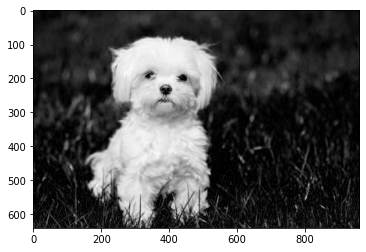

In [7]:
# Show each channel channel on screen
plt.imshow(B,cmap='gray')


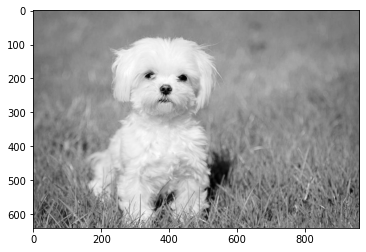

In [8]:
plt.imshow(G,cmap='gray')


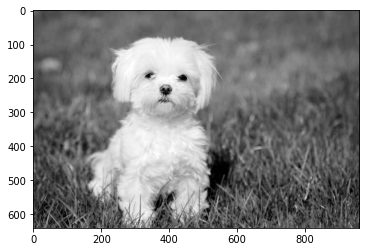

In [9]:
plt.imshow(R,cmap='gray')

#### Merging the color channels

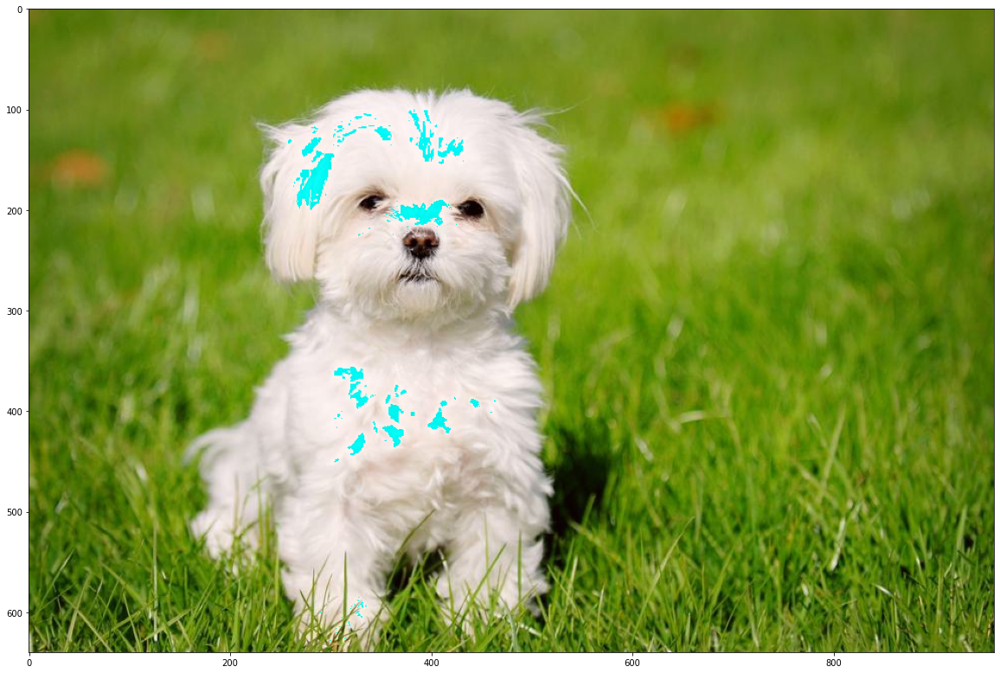

In [10]:
# Modify a channel and then merge them all again
R = R+10
imgMerge=cv2.merge([B,G,R])
imshow(imgMerge)

[Hint](# "cv2.merge") 

In [11]:
# Create a black canvas with the same size as the image you loaded

imgblk = np.zeros(imgMerge.shape[:2],dtype=np.uint8)



 

[Hint](# "use numpy np.zeros function with the img.shape[:2]") 

In [12]:
# Merge each channel with the black canvas 
# So you will end up with 3 images: (Red,Black,Black), (Black,Green,Black) and (Black,Black,Blue) 
# Assuming you are working with RGB, but BGR is also fine
imgblk = np.zeros(imgMerge.shape[:2],dtype=np.uint8)
imgBBB=cv2.merge([B,imgblk,imgblk])
imgBGB=cv2.merge([imgblk,G,imgblk])
imgBBR=cv2.merge([imgblk,imgblk,R])

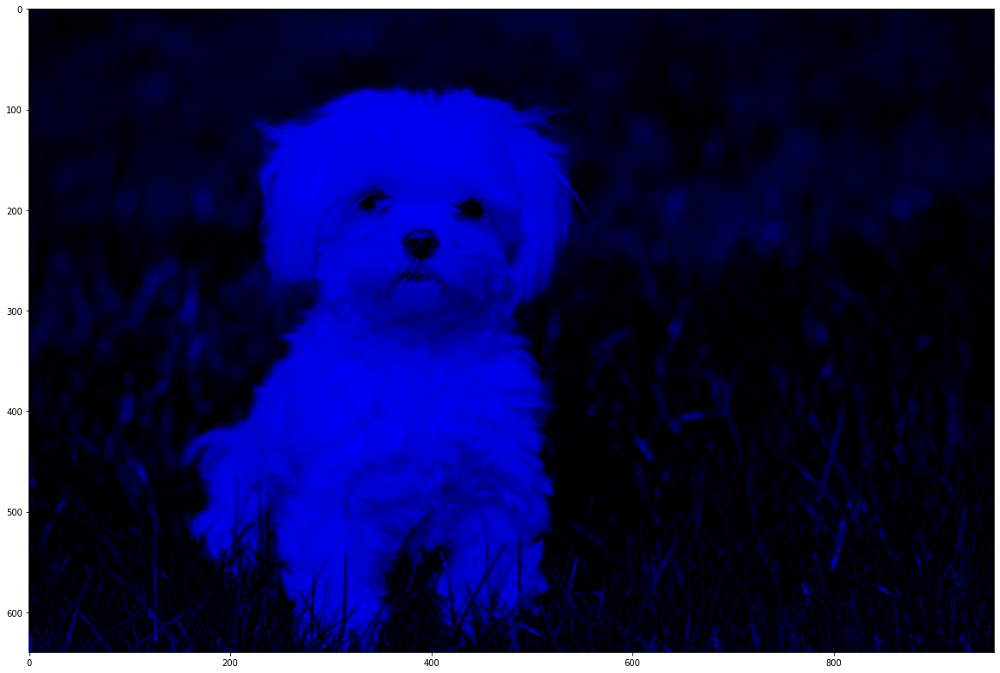

In [13]:
imshow(imgBBB)

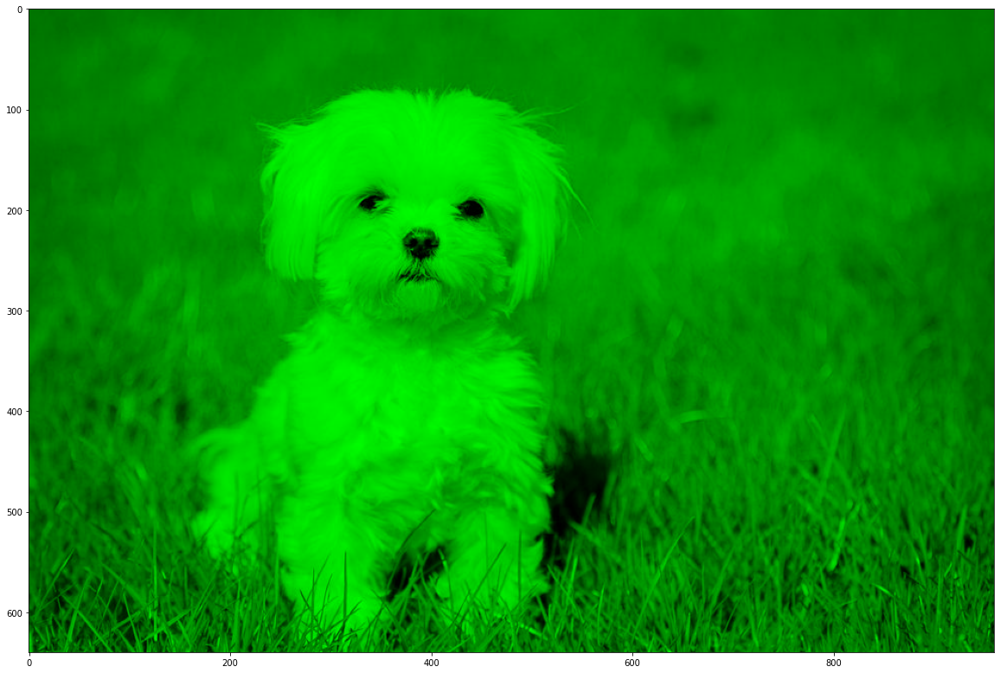

In [14]:
imshow(imgBGB)

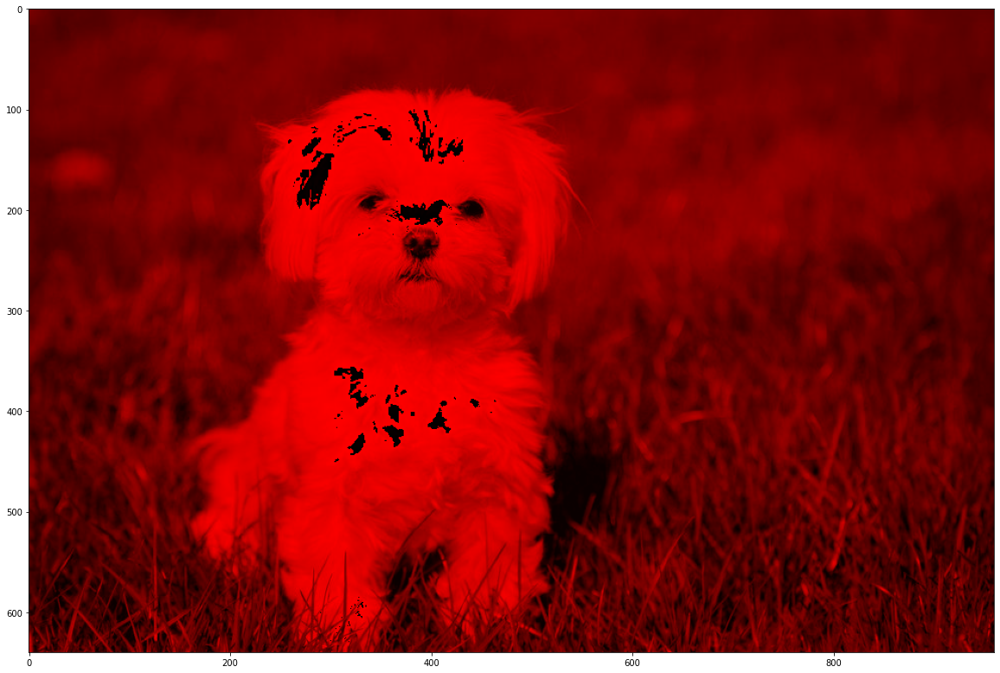

In [15]:
imshow(imgBBR)

[Hint](# "cv2.merge") 

### HSV: Hue Saturation Value

#### M&Ms challenge!

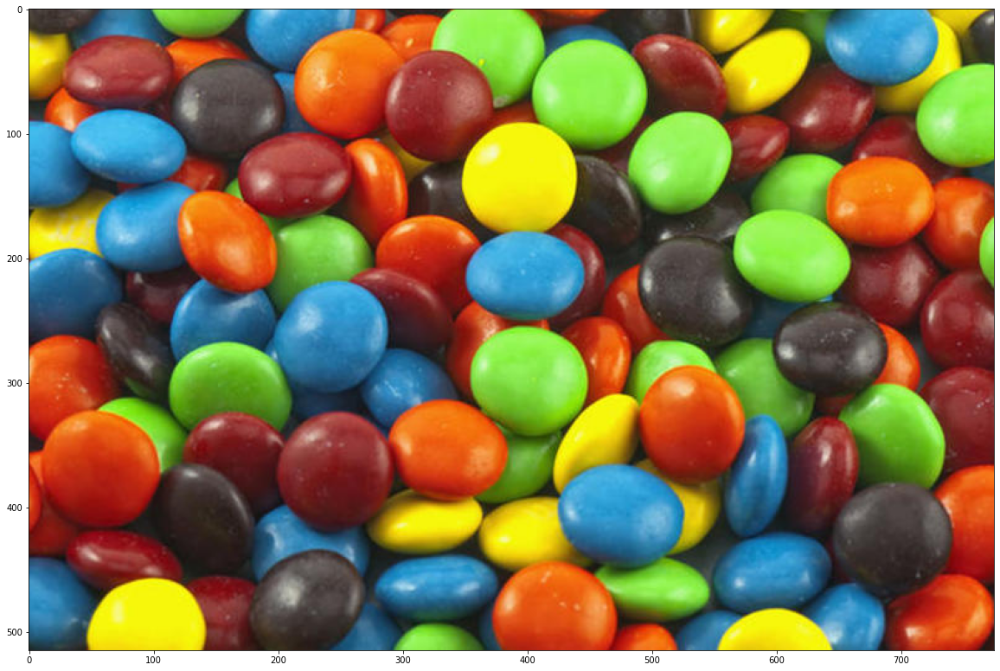

In [55]:
# Use the image below and convert it from BGR to HSV
img = cv2.imread('img/m.jpg')
plt.figure(figsize = (20,15));
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB));
hsv=cv2.cvtColor(img,cv2.COLOR_BGR2HSV)

In [17]:
# Split the H,S and V channels 
h,s,v = cv2.split(hsv)


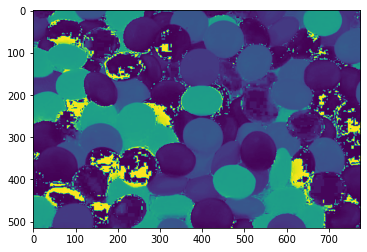

In [18]:
plt.imshow(h)

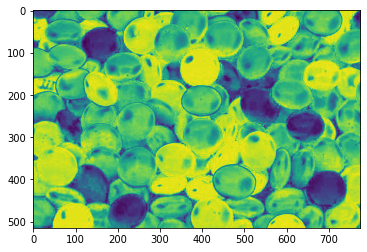

In [19]:
plt.imshow(s)

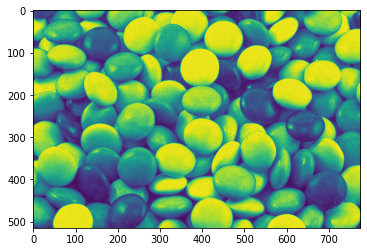

In [20]:
plt.imshow(v)

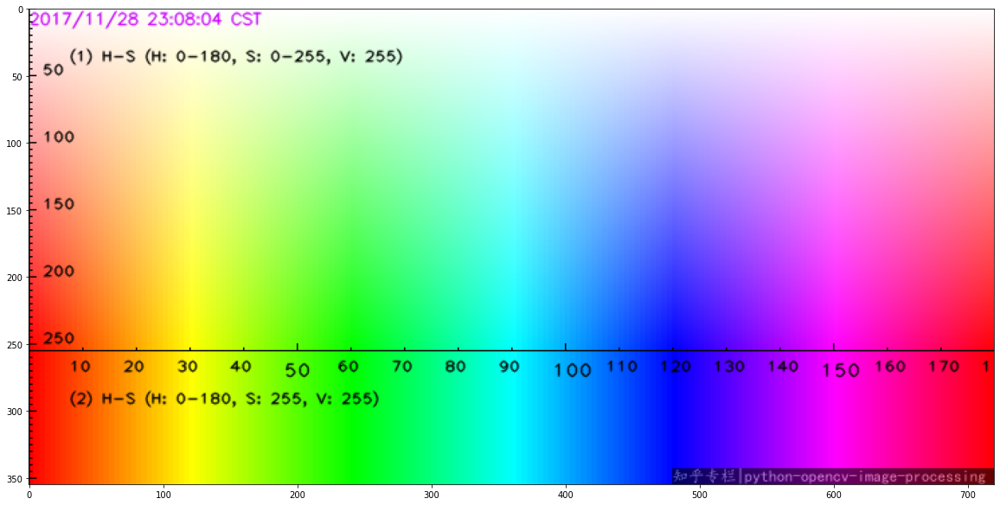

In [21]:
imghsv = cv2.imread('img/hsv.png')
plt.figure(figsize = (20,15));
plt.imshow(cv2.cvtColor(imghsv,cv2.COLOR_BGR2RGB));


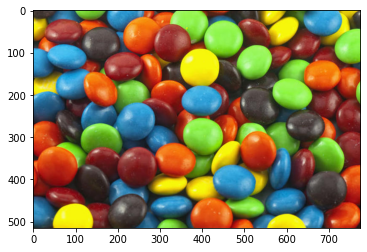

In [22]:
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB));

In [23]:


def nothing(x):
    pass

def hsv_calc():
    cv2.namedWindow("selector",)
    cv2.createTrackbar("lh","selector",0,179,nothing)
    cv2.createTrackbar("ls","selector",0,255,nothing)
    cv2.createTrackbar("lv","selector",0,255,nothing)
    cv2.createTrackbar("uh","selector",179,179,nothing)
    cv2.createTrackbar("us","selector",255,255,nothing)
    cv2.createTrackbar("uv","selector",255,255,nothing)
    while True:
       
        hsv = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)

        lh = cv2.getTrackbarPos("lh","selector")
        ls = cv2.getTrackbarPos("ls","selector")
        lv = cv2.getTrackbarPos("lv","selector")
        uh = cv2.getTrackbarPos("uh","selector")
        us = cv2.getTrackbarPos("us","selector")
        uv = cv2.getTrackbarPos("uv","selector")

        l_blue = np.array([lh,ls,lv])
        u_blue = np.array([uh,us,uv])
        mask = cv2.inRange(hsv, l_blue, u_blue)
        result = cv2.bitwise_or(img,img,mask=mask)

        cv2.imshow("Image",img)
        cv2.imshow("mask",mask)
        cv2.imshow("result",result)
        key = cv2.waitKey(1)
        if key == 27:
            break
    cv2.destroyAllWindows()
    print(lh,ls,lv)
    print(uh,us,uv)

hsv_calc()

33 60 60
63 255 255


[Hint](# "cv2.cvtColor") 

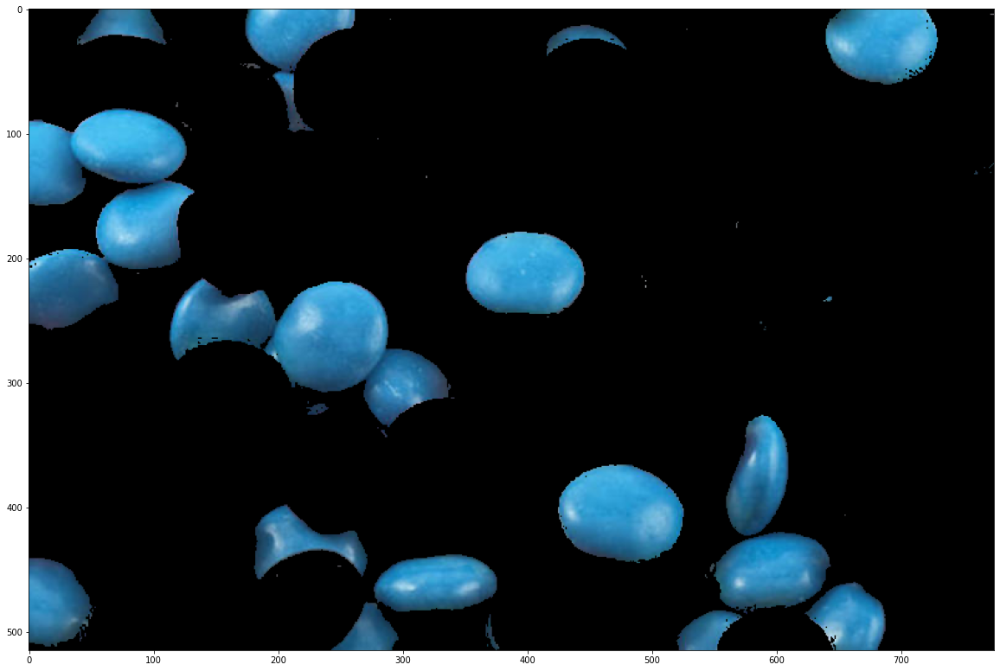

In [26]:
# Create a mask to filter out the Blue M&Ms (remember you need a lower and upper range)
# Make a copy of the hsv image and apply the mask to it, then display the image
bluelower = (95,2,77)
blueupper =(133,255,255)
bluemask=cv2.inRange(hsv,bluelower,blueupper)
maskedblue_img = img.copy()
maskedblue_img[bluemask==0]=[0,0,0]
imshow(maskedblue_img)

[Hint](# "cv2.inRange") 

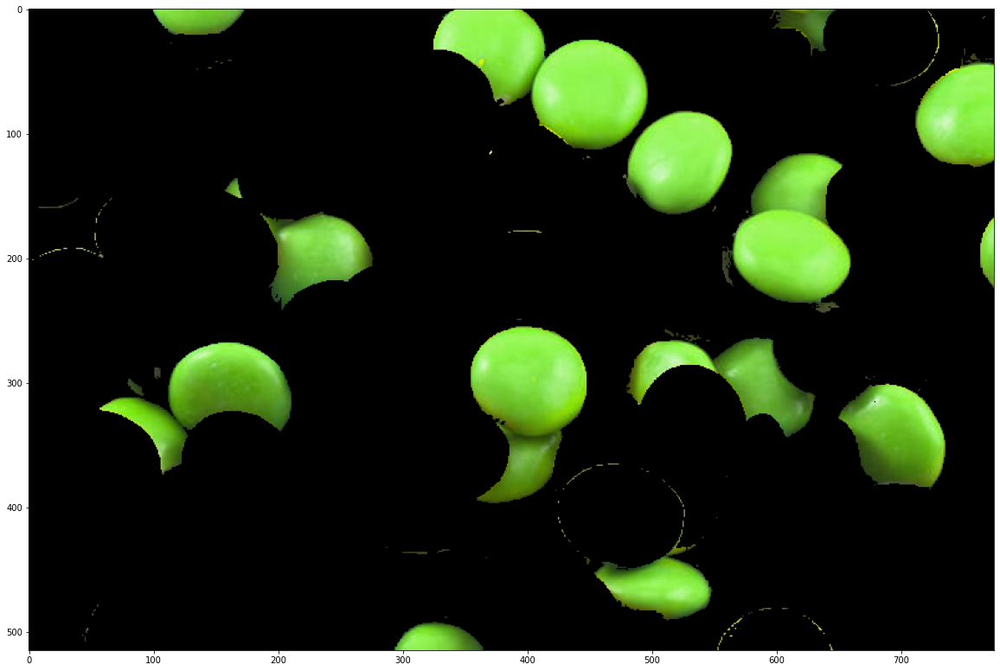

In [27]:
# Repeat the same but now with the greens
greenlower = (33,60,60)
greenupper =(63,255,255)
greenmask=cv2.inRange(hsv,greenlower,greenupper)
maskedgreen_img = img.copy()
maskedgreen_img[greenmask==0]=[0,0,0]
imshow(maskedgreen_img)

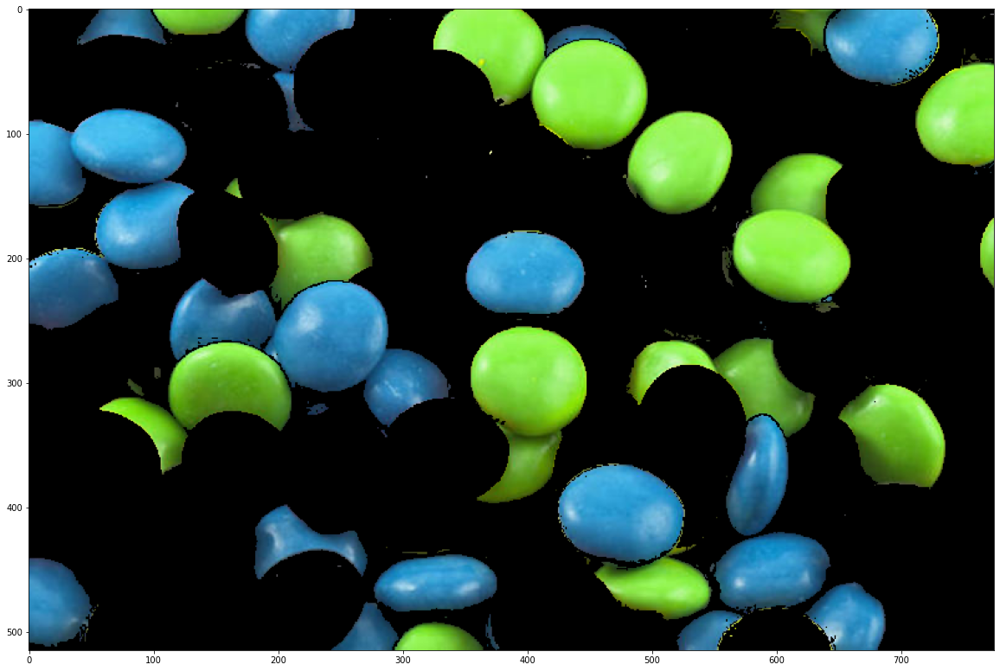

In [29]:
# Now combine both masks togheter so we can see all greens and blues in the same image!
imgreenblue=maskedblue_img+maskedgreen_img
imshow(imgreenblue)

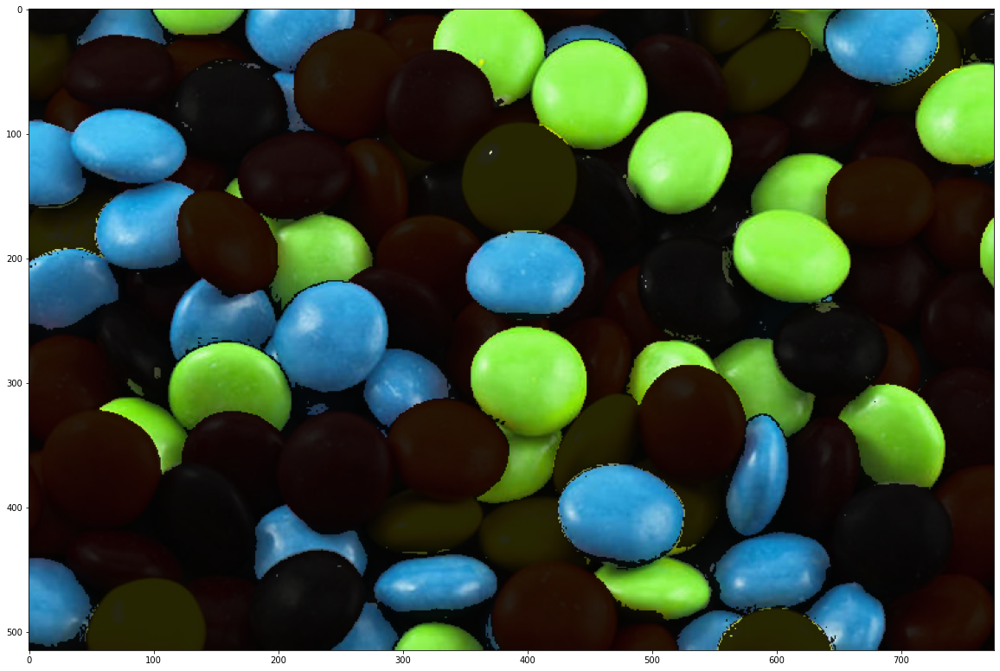

In [58]:
# Now lets combine both masks but also some opacity, we want to be able to see all M&Ms but
# Blues and greens will show as int he image above while the other colors will be faded out with some opacity
# You just need to add alpha to apply opacity to the dark parts of the mask, then display the image

imgover=cv2.addWeighted(imgreenblue,0.85,img,0.15,0)
imshow(imgover)

[Hint](# "cv2.addWeighted") 

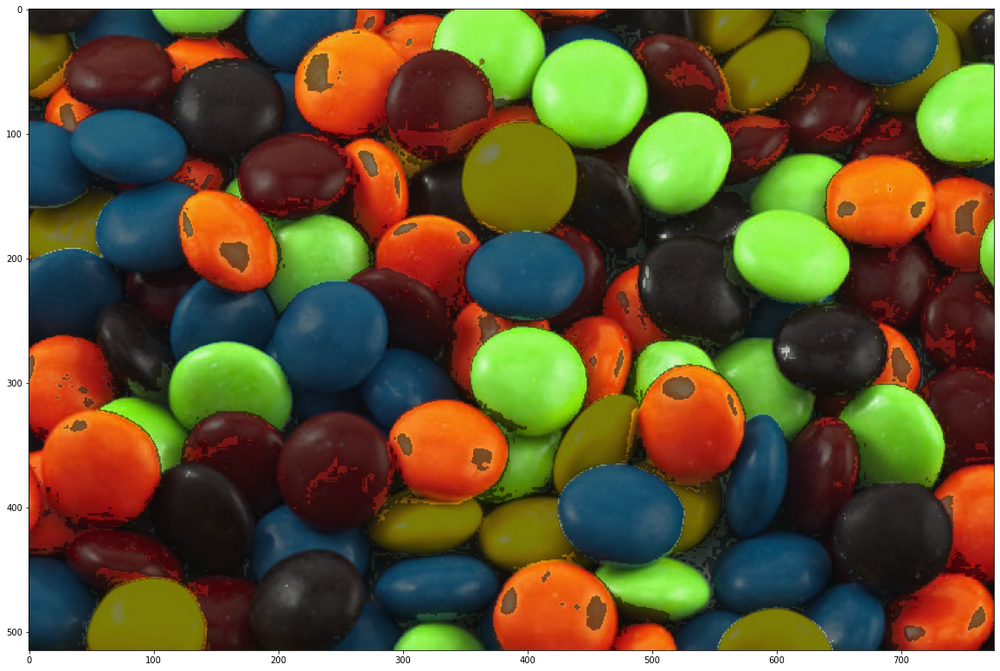

In [9]:
# Below you will find an example with oranges and greens just for reference so you can see what we want to accomplish
# In this example the oranges are not perfect, and it can be improved a lot easily.

## Mini project

### Level 1

#### Ball tracker

1. Given an image with a ball on it isolate the ball

### Level 2

#### Ball tracker

1. Make it track a ball in real time (either with a video or a webcam)

### Level 3

#### Ball Tracker

1. Can you make it track two or more different color balls at the same time?